# <u><center>Régression linéaire</center></u>

On va procéder par étape, d'abord on va créer un df avec uniquement les lignes non nulles qu'on enregistre dans une variable **data_non_null**

In [11]:
data_non_null = data[data['margin_low'].isnull()==False]
# Affichage des cinq première lignes du df 
data_non_null.head()

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
0,True,171.81,104.86,104.95,4.52,2.89,112.83
1,True,171.46,103.36,103.66,3.77,2.99,113.09
2,True,172.69,104.48,103.50,4.40,2.94,113.16
3,True,171.36,103.91,103.94,3.62,3.01,113.51
4,True,171.73,104.28,103.46,4.04,3.48,112.54


Vérifions la forme du df avec la méthode .shape

In [12]:
data_non_null.shape

(1463, 7)

On dispose bien de 1463 lignes !

## Régression naïve

Une régression naïve (ou modèle naïf) est une méthode simple de prédiction qui suppose qu'il n'y a pas de relation entre la variable d'entrée et la variable cible. Dans une régression naïve, la prédiction pour chaque observation peut être tout simplement la valeur moyenne de la variable cible pour l'ensemble des observations.

Par exemple, si nous avons un ensemble de données avec une variable explicative X et une variable cible Y, le modèle naïf prédit que toutes les valeurs de Y sont égales à la moyenne de toutes les valeurs de Y dans l'ensemble de données, indépendamment de la valeur de X.

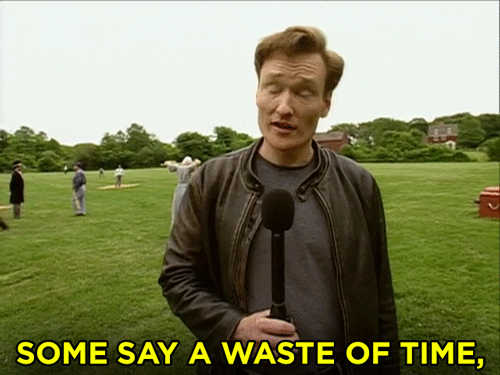

Ce n'est pas inutile bien au contraire ! La régression naïve sera utilisée afin de servir de point de référence (baseline) simple pour évaluer la performance d'autres modèles de régression plus complexes. 
En comparant les résultats d'un modèle plus complexe avec ceux du modèle naïf, on peut évaluer si le modèle plus complexe apporte une amélioration significative de la prédiction par rapport à un modèle très simple.
Commençons !

On importe la classe **DummyRegressor** du module **sklearn.dummy**

In [13]:
from sklearn.dummy import DummyRegressor

On sépare les variables indépendantes (**X**) de la variable cible (**y**).

In [14]:
# X = df composé de toutes les colonnes à l'exception de "margin_low"
X = data_non_null.drop('margin_low', axis=1)
# y = df composé uniquement de la colonnes "margin_low"
y = data_non_null['margin_low']

On crée une instance de DummyRegressor

In [15]:
dummy_model = DummyRegressor(strategy="mean")

On entraine notre modèle

In [16]:
dummy_model.fit(X,y)

DummyRegressor()

On applique notre modèle entrainé sur nos données **X** afin de prédire **y** on enregistre les prédictions dans une variable **dummy_y_pred**

In [17]:
dummy_y_pred = dummy_model.predict(X)

Notre variable devrait être normalement composée d'une valeur unique correspondant là la moyenne de **y**. 

In [18]:
# vérification du nombre de valeurs uniques :
np.unique(dummy_y_pred)

array([4.48596719])

On a bien une seule valeur:**4.48596719**

In [19]:
print ( " La moyenne de la colonne margin_low est de :",data_non_null["margin_low"].mean())

 La moyenne de la colonne margin_low est de : 4.485967190704033


Et elle correspond bien à la moyenne de la colonne **margin_low**. Maintenant On calcule le score de ce modèle ! on va utiliser pour ça le R2 (coefficient de détermination) qui est une mesure de l'ajustement global du modèle aux données, qui indique la proportion de variance totale des données expliquée par le modèle. Il varie entre 0 et 1, où une valeur de 1 indique un ajustement parfait du modèle.

In [20]:
from sklearn.metrics import r2_score
dummy_score = r2_score(y, dummy_y_pred)
print("Le score R² pour le modèle DummyRegressor est ( roulement de tambour ) :", dummy_score)

Le score R² pour le modèle DummyRegressor est ( roulement de tambour ) : 0.0


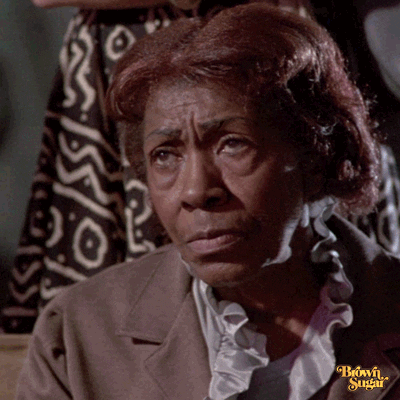

Voyons les bons côté de la chose :
- on savait que les résultat allaient être catastrophiques
- on ne pourra que mieux faire !
- on peut passer à la prochaine étape !

# Régression linéaire

In [21]:
# On importe LinearRegression
from sklearn.linear_model import LinearRegression

# On garde les mêmes variables d'entrée (X) et cible (y)
X = data_non_null.drop('margin_low', axis=1)
y = data_non_null['margin_low']

# On crée une instance du modèle de régression linéaire
lr = LinearRegression()

# On entraîne le modèle avec les données d'entrée et la variable cible
lr.fit(X, y)

# On fait la prédiction avec le modèle entraîné qu'on enregistre dans une variable y_pred
y_pred = lr.predict(X)

# On calcule enfin le R² pour le modèle
score = r2_score(y, y_pred)

# Afficher le R²
print("Le score R² pour ce modèle de régression linéaire est :", score)

Le score R² pour ce modèle de régression linéaire est : 0.616876075567103


Bien mieux ! On arrive à 0.62, on a clairement fait des progrès et le modèle est significativement meilleurs qu'une modèle naïf. Passons à l'application, complétons nos données manquantes.

# Validation du modèle par analyse de résidus

De quoi on parle quand on parle de résidus ?

Les résidus c'est la différence entre les valeurs observées et les valeurs prédites par le modèle de régression. Dans le contexte de la régression linéaire, les résidus représentent les écarts entre les observations réelles et les valeurs estimées par la droite de régression.

Les résidus mesurent donc les erreurs de prédiction du modèle de régression.

Mathématiquement, les résidus peuvent être représentés comme suit :

Résidu = Valeur observée - Valeur prédite

L'analyse des résidus est une étape essentielle de la régression linéaire, car elle permet de vérifier les hypothèses du modèle et d'évaluer la qualité de l'ajustement. Les propriétés des résidus, telles que la normalité, l'homoscédasticité et l'absence de corrélation, sont souvent examinées pour s'assurer de la validité du modèle de régression.

On régresser margin_low en fonction des autres variables de l'échantillon.

In [22]:
# reg_linb =  smf.ols("margin_low ~ diagonal + height_left + height_right + margin_up + length", data = data_non_null).fit()
# # res_lin = reg_linb.fit()
# print(reg_linb.summary())

In [24]:
# Instanciation:
reg_lin = smf.ols("margin_low ~ diagonal + height_left + height_right + margin_up + length", data = data).fit()

# Calculs:

print(reg_lin.summary())

                            OLS Regression Results                            
Dep. Variable:             margin_low   R-squared:                       0.477
Model:                            OLS   Adj. R-squared:                  0.476
Method:                 Least Squares   F-statistic:                     266.1
Date:                Tue, 16 May 2023   Prob (F-statistic):          2.60e-202
Time:                        15:26:33   Log-Likelihood:                -1001.3
No. Observations:                1463   AIC:                             2015.
Df Residuals:                    1457   BIC:                             2046.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       22.9948      9.656      2.382   

La **probabilité de la statistique F** ( ligne **"Prob (F-statistic)"**): Le test de Fisher évalue l'hypothèse nulle selon laquelle tous **les coefficients sont nuls**, ce qui signifierait qu'il n'y a pas de relation significative entre les variables indépendantes et la variable dépendante (c'est-à-dire que le modèle global n'est pas significatif). Dans notre cas, la probabilité de la statistique **F est très faible**, ce qui signifie qu'elle est inférieure au seuil alpha de 5 % (ou 1 %). **Par conséquent, nous rejetons l'hypothèse nulle et concluons que notre modèle est significativement meilleur que celui où les coefficients seraient nuls**. En d'autres termes, il existe une relation significative entre les variables indépendantes et la variable dépendante dans notre modèle

C'est une chose qu'on a déjà vérifier avec notre **Dummy regressor.**


Le coefficient de détermination ajusté (R² ajusté) est inférieur à 0,5. On se rappelle qu'il est de **0,62 avec la bibliothèque scikit-learn, donc l'importance de ce nombre est à nuancer**. Il indique cependant que le modèle ne parvient pas à expliquer une proportion significative de la variation totale de la variable dépendante en utilisant la variation de la variable indépendante. 


Pour vérifier l'hypothèse de non-autocorrélation, nous examinons la corrélation des résidus dans le temps. Un outil couramment utilisé est le test de **Durbin-Watson**.  
Un résultat inférieur à 1,5 suggère une autocorrélation positive, ce qui signifie que les erreurs sont corrélées positivement dans le temps. Un résultat compris entre 1,5 et 2,5 indique l'absence d'autocorrélation, ce qui est favorable à l'hypothèse de non-autocorrélation. Un résultat supérieur à 2,5 suggère une autocorrélation négative, ce qui signifie que les erreurs sont corrélées négativement dans le temps.  

Dans ce cas précis, le test de Durbin-Watson donne une valeur de **1,893, ce qui indique l'absence d'autocorrélation. Cela signifie que les erreurs ne sont pas corrélées de manière significative dans le temps, et donc que l'hypothèse de non-autocorrélation est satisfaite."**  

Dans le contexte de la régression linéaire, **l'hypothèse fondamentale est que les résidus ont une moyenne de zéro.** Cela signifie que, en moyenne, les résidus ne sont **pas biaisés** et que le modèle de régression est capable de capturer la **tendance générale des données**. Si la moyenne des résidus est significativement différente de zéro, cela suggère qu'il y a un biais systématique dans les prédictions du modèle.

On calcule la moyenne des résidus de la régression linéaire, qui peut être comparée à zéro. Si la moyenne des résidus est proche de zéro, cela indique que l'hypothèse de moyenne nulle des résidus est vérifiée, renforçant ainsi la validité du modèle de régression.

In [25]:
residus = y- y_pred

# Calculer la moyenne des résidus
mean_residus = residus.mean()
print("La moyenne des résidus est :", mean_residus)

La moyenne des résidus est : -3.72755673066218e-16


La moyenne étant très proches de zéro, on peut considérer cette hypothèse comme validée.

# Multicolinéarité : 

On suppose que les prédicteurs utilisés dans la régression ne sont pas corrélés les uns aux autres. Le cond. No. est élevée il semble qu'il y ai un problème de multicollinéarité. 

In [27]:
variables = reg_lin.model.exog
[variance_inflation_factor(variables, i) for i in np.arange(1,variables.shape[1])]

[1.0136128990686297,
 1.1382605736082483,
 1.2301145155560362,
 1.4044037781843615,
 1.576950145366581]

Ces valeurs du VIF indiquent le degré de colinéarité entre chaque variable prédictive et les autres variables dans le modèle de régression linéaire multiple. Des valeurs proches de 1 suggèrent une faible colinéarité, ce qui est souhaitable. Dans votre cas, les valeurs du VIF pour chaque variable sont toutes inférieures à 2, ce qui indique une faible colinéarité entre les variables. Cela signifie que les variables prédictives ne sont pas fortement corrélées les unes avec les autres, ce qui est généralement souhaitable pour une analyse robuste.

# Linéarité ? 

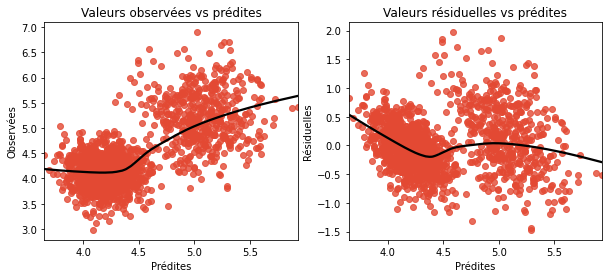

In [29]:
# Linearite:
def linearity_test(model, y):
    '''
    Function for visually inspecting the assumption of linearity in a linear regression model.
    It plots observed vs. predicted values and residuals vs. predicted values.
    
    Args:
    * model - fitted OLS model from statsmodels
    * y - observed values
    '''
    fitted_vals = model.predict()
    resids = model.resid

    fig, ax = plt.subplots(1,2,figsize=(10,4))
    
    sns.regplot(x=fitted_vals, y=y, lowess=True, ax=ax[0], line_kws={'color': 'black'})
    ax[0].set_title("Valeurs observées vs prédites")
    ax[0].set(xlabel="Prédites", ylabel="Observées")

    sns.regplot(x=fitted_vals, y=resids, lowess=True, ax=ax[1], line_kws={'color': 'black'})
    ax[1].set_title("Valeurs résiduelles vs prédites")
    ax[1].set(xlabel="Prédites", ylabel="Résiduelles")
    
linearity_test(reg_lin, data_non_null["margin_low"])

### distribution normale des résidus ?

<ipython-input-30-8b86d75895fc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_non_null["Résidus(y -y_pred)"] = y -y_pred


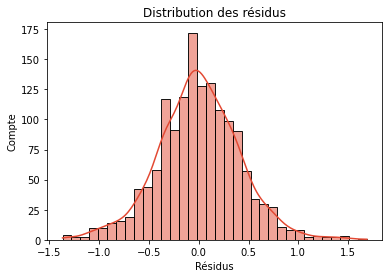

In [30]:
# Creation d'une colonne contenant les residus:
data_non_null["Résidus(y -y_pred)"] = y -y_pred

# Graphique:
sns.histplot(data_non_null["Résidus(y -y_pred)"], kde=True)
plt.xlabel("Résidus")
plt.ylabel("Compte")
plt.title("Distribution des résidus")
plt.show()

In [31]:
# Normalite:
print("La p-value du test d'Aderson-Darling vaux", normal_ad(data_non_null["Résidus(y -y_pred)"])[1])

La p-value du test d'Aderson-Darling vaux 3.9857722331535204e-05


Deux test contradictoire ont été réalisés : Omnibus et Jarque Bera.

Pour confirmer la normalité des résidus et lever tout doute, un autre test tel que le test d'Anderson-Darling peut être effectué. Si le test d'Anderson-Darling indique que les résidus suivent une distribution normale, cela renforce l'idée que l'hypothèse de normalité est vérifiée."

Le test d'Anderson-Darling n'est pas un test de normalité spécifique pour la distribution des résidus dans le contexte de la régression linéaire. Il s'agit d'un test de normalité général pour évaluer si un échantillon suit une distribution normale.

De plus, il est important de noter que l'hypothèse de normalité des résidus n'est pas obligatoire pour obtenir des estimations valides dans la régression linéaire. Les estimations des coefficients restent valides même si les résidus ne suivent pas une distribution normale. Toutefois, l'hypothèse de normalité est souvent souhaitée pour effectuer des tests d'inférence statistique, construire des intervalles de confiance précis et garantir certaines propriétés statistiques.  

Ici, la P-value est très inférieure à alpha.

### Vérification de l'hypothèse d'homocédasticité

On doit vérifier l'hypothèse d'homocédasticité qui fait référence à l'assomption selon laquelle les variances des résidus d'un modèle de régression linéaire sont constantes à travers toutes les valeurs prédites. Pour évaluer cette hypothèse, on peut utiliser des tests statistiques tels que le test de Breusch-Pagan et le test de White. 

In [33]:
_, pval, __, f_pval = statsmodels.stats.diagnostic.het_breuschpagan(residus, variables)
print('p value test Breusch Pagan:', pval)

p value test Breusch Pagan: 1.1486060875218777e-23


Le test de Breusch-Pagan est couramment utilisé pour tester l'homocédasticité, mais il peut donner des résultats peu fiables lorsque les données suivent une distribution non normale ou lorsque la relation entre les variables n'est pas linéaire. Par conséquent, le test de White est souvent préféré car il est plus robuste dans ces situations. En fait, le test de White est une forme particulière du test de Breusch-Pagan.  

L'évaluation de l'homocédasticité est importante car une violation de cette hypothèse peut entraîner des estimations de coefficients biaisées et des intervalles de confiance incorrects. Si l'homocédasticité n'est pas satisfaite, des méthodes de correction ou de transformation des données peuvent être nécessaires pour obtenir des résultats fiables à partir du modèle de régression linéaire.

### Test de white :

{'Test Statistic': 109.86015196901874, 'p-value': 2.082824498667446e-14, 'F-Statistic': 5.853731207821833, 'F-Test p-value': 4.974865091900643e-15}


Text(0.5, 1.0, 'Homoscédasticité')

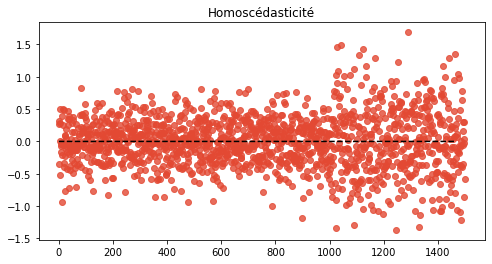

In [35]:
# Homoscedasticite:
white_test = het_white(reg_lin.resid, reg_lin.model.exog)
labels_white_test = ["Test Statistic", "p-value", "F-Statistic", "F-Test p-value"]
print(dict(zip(labels_white_test, white_test)))

# Graphique:
plt.subplots(figsize=(8, 4))
plt.scatter(x=data_non_null.index, y=data_non_null["Résidus(y -y_pred)"], alpha=0.8)
plt.plot(np.repeat(0, len(data_non_null.index)+2), color="black", linestyle='--')
plt.title("Homoscédasticité")

La répartition semble aléatoire sur le graphique. L'hypothèse nulle du test de White est qu'il y a homoscédasticité (les résidus sont dispersés aléatoirement. La p value est inférieure à alpha 5% ou 1%

En conclusion on a un modèle avec :

- des moyennes à 0
- pas d'autocorrélation
- un r² a 0.62 sur scikit learn et à 0.47 sur statmodel
- une efficacité plus grande qu'un Dummy regressor
- pas de multicollinéarité
- une distribution normale des résidus
- de l'homocédasticité
- et une relation à peu près linéaire (on n'observe pas de relations clairement non linéaires ou de schémas qui suggèrent une relation autre que linéaire telles qu'une relations quadratique, exponentielle, logarithmique ou polynomiale)

In [36]:
data_non_null=data_non_null.drop(["Résidus(y -y_pred)"], axis=1)

In [37]:
data_non_null.head()

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
0,True,171.81,104.86,104.95,4.52,2.89,112.83
1,True,171.46,103.36,103.66,3.77,2.99,113.09
2,True,172.69,104.48,103.50,4.40,2.94,113.16
3,True,171.36,103.91,103.94,3.62,3.01,113.51
4,True,171.73,104.28,103.46,4.04,3.48,112.54


# <u>Imputation de données manquantes avec une régression linéaire</u>

<i> NB: Dans la prochaine section beaucoup du travail déjà fait sera refait, on pourrait créer la regression linéaire sans s'encombrer de beaucoup des étapes que je présenterai, mais c'est un choix que j'assume dans un soucis de pédagogie . </i>

On a importé la classe LinearRegression du module sklearn.linear_model, et créer une instance de cette classe.  
  
  Divisons nos données en deux ensembles:

- un ensemble de test qui contient toutes les lignes avec des valeurs manquantes dans la colonne "margin_low"
- un ensemble d'entraînement qui contient toutes les lignes avec des valeurs non manquantes dans cette colonne.

In [38]:
testdf = data[data['margin_low'].isnull()==True]
testdf

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
72,True,171.94,103.89,103.45,NaN,3.25,112.79
99,True,171.93,104.07,104.18,NaN,3.14,113.08
151,True,172.07,103.80,104.38,NaN,3.02,112.93
197,True,171.45,103.66,103.80,NaN,3.62,113.27
241,True,171.83,104.14,104.06,NaN,3.02,112.36
251,True,171.80,103.26,102.82,NaN,2.95,113.22
284,True,171.92,103.83,103.76,NaN,3.23,113.29
334,True,171.85,103.70,103.96,NaN,3.00,113.36
410,True,172.56,103.72,103.51,NaN,3.12,112.95
413,True,172.30,103.66,103.50,NaN,3.16,112.95


La fonction **len()**, nous permettra de compter le nombre de lignes de **testdf**. on aurait pu utiliser la méthode **.shape**

In [39]:
len(testdf)

37

On voit que **les 37 valeurs manquantes** sont bien présentes. On n'oublie pas de **créer un ensemble d'entraînement** qui contient toutes les lignes avec des valeurs non manquantes dans cette colonne.

In [40]:
traindf = data[data['margin_low'].isnull()==False]
traindf

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
0,True,171.81,104.86,104.95,4.52,2.89,112.83
1,True,171.46,103.36,103.66,3.77,2.99,113.09
2,True,172.69,104.48,103.50,4.40,2.94,113.16
3,True,171.36,103.91,103.94,3.62,3.01,113.51
4,True,171.73,104.28,103.46,4.04,3.48,112.54
...,...,...,...,...,...,...,...
1495,False,171.75,104.38,104.17,4.42,3.09,111.28
1496,False,172.19,104.63,104.44,5.27,3.37,110.97
1497,False,171.80,104.01,104.12,5.51,3.36,111.95
1498,False,172.06,104.28,104.06,5.17,3.46,112.25


 On créer ensuite, **x_train** et **y_train** à partir des données d'entraînement.

- x_train est composé de toutes les colonnes à l'exception de **margin_low**.
- y_train est composé uniquement de **margin_low**.

In [41]:
x_train = traindf.drop("margin_low",axis=1)
# Jetons maintenant un oeil sur les cinq premières lignes de notre df:
x_train.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length
0,True,171.81,104.86,104.95,2.89,112.83
1,True,171.46,103.36,103.66,2.99,113.09
2,True,172.69,104.48,103.50,2.94,113.16
3,True,171.36,103.91,103.94,3.01,113.51
4,True,171.73,104.28,103.46,3.48,112.54


La colonne **margin_low** a disparu.

In [42]:
y_train = traindf['margin_low']
# Jetons maintenant un oeil sur les cinq premières lignes de notre df:
y_train.head()

0    4.52
1    3.77
2    4.40
3    3.62
4    4.04
Name: margin_low, dtype: float64

On adapte la regression linéaire à nos données avec **.fit()**

In [43]:
lr.fit(x_train,y_train)

LinearRegression()

In [44]:
#testdf

On créer ensuite, **x_test** à partir des données de test.

In [45]:
x_test=testdf.drop("margin_low",axis=1)
# Jetons maintenant un oeil sur les cinq premières lignes de notre df:
x_test.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length
72,True,171.94,103.89,103.45,3.25,112.79
99,True,171.93,104.07,104.18,3.14,113.08
151,True,172.07,103.80,104.38,3.02,112.93
197,True,171.45,103.66,103.80,3.62,113.27
241,True,171.83,104.14,104.06,3.02,112.36


Grace à la méthode .predict() on va déterminer les valeur de y ( enregistrées dans une variable **y_pred**) en fonction des valeurs de **x_test**

In [46]:
# x_test

In [47]:
# y_test = testdf['margin_low']
# # Jetons maintenant un oeil sur les cinq premières lignes de notre df:
# y_test.head()

In [48]:
y_pred= lr.predict(x_test)

Jetons un coup d'oeil à ces données

In [49]:
y_pred

array([4.06495361, 4.11199026, 4.13400328, 3.99357074, 4.1403993 ,
       4.09428392, 4.07412432, 4.12538999, 4.0807278 , 4.07363322,
       4.11897255, 4.18037978, 4.13648423, 4.05106842, 4.17837685,
       4.22555104, 4.11586845, 4.10284101, 4.08184346, 4.09276238,
       4.11250192, 4.15717623, 4.16028787, 4.12193808, 4.12353555,
       4.19842271, 4.10962313, 4.09696025, 4.13384101, 5.25968515,
       5.264817  , 5.28251853, 5.30206887, 5.20035843, 5.1754678 ,
       5.17345045, 5.24675055])

Et si nous les comptions ? Il devrait y en avoir 37...

In [50]:
len(y_pred)

37

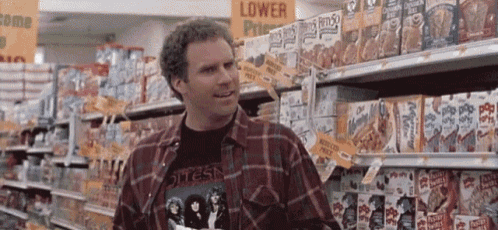

Pour incorporer les valeurs prédites dans le dataframe data, On peut utiliser la méthode .loc pour sélectionner les lignes correspondant à l'ensemble de test, puis assigner les valeurs prédites à la colonne "margin_low". 

In [51]:
data.loc[testdf.index, 'margin_low'] = y_pred

La méthode loc permet de sélectionner les lignes à l'aide de leur index. Ici, nous utilisons l'index de l'ensemble de test (testdf.index) pour sélectionner les lignes correspondantes dans le dataframe data. Nous assignons ensuite les valeurs prédites (pred) à la colonne "margin_low" pour ces lignes. Les autres valeurs de la colonne "margin_low" qui n'ont pas été prédites seront laissées telles quelles.  
  
  
Dernière étape: On vérifie avec la méthode .info()

In [52]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   is_genuine    1500 non-null   bool   
 1   diagonal      1500 non-null   float64
 2   height_left   1500 non-null   float64
 3   height_right  1500 non-null   float64
 4   margin_low    1500 non-null   float64
 5   margin_up     1500 non-null   float64
 6   length        1500 non-null   float64
dtypes: bool(1), float64(6)
memory usage: 71.9 KB


Plus de valeurs nulles ! Parfait !